In [2]:
!pip install seaborn
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 3.2 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 61.0 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [21]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder  
ohe = OneHotEncoder(sparse=False)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
import sys
np.set_printoptions(threshold=sys.maxsize)
# Plotly Libraris
import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
df = pd.read_csv("/kaggle/input/slayer/penyisihan-mlc-data-slayer-2023/train.csv")
df_orig = df.copy()

/kaggle/input/slayer/Slayer_Train1_Dataclean.xlsx
/kaggle/input/slayer/penyisihan-mlc-data-slayer-2023/sample_submission.csv
/kaggle/input/slayer/penyisihan-mlc-data-slayer-2023/train.csv
/kaggle/input/slayer/penyisihan-mlc-data-slayer-2023/test.csv


In [22]:
print("data info :")
print(df.info())
print("data shape :")
print(df.shape)

data info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Id                     137141 non-null  int64  
 1   Make                   137141 non-null  object 
 2   Vehicle Class          135816 non-null  object 
 3   Engine Size(L)         120522 non-null  object 
 4   Cylinders              122986 non-null  object 
 5   Transmission           134536 non-null  object 
 6   Fuel Type              135286 non-null  object 
 7   Fuel Consumption City  134719 non-null  object 
 8   Fuel Consumption Hwy   134573 non-null  object 
 9   Fuel Consumption Comb  134559 non-null  object 
 10  CO2 Emissions(g/km)    137141 non-null  float64
dtypes: float64(1), int64(1), object(9)
memory usage: 11.5+ MB
None
data shape :
(137141, 11)


masih banyak NaN

In [23]:
df = df.rename({
    'Vehicle Class' : 'Vehicle_Class' , 
    'Engine Size(L)': 'Engine_Size' ,
    'Fuel Type' : 'Fuel_Type',
    'Fuel Consumption City' : 'Fuel_Consumption_City_(L/100km)' , 
    'Fuel Consumption Hwy' : 'Fuel_Consumption_Hwy_(L/100km)' ,
    'Fuel Consumption Comb' : 'Fuel_Consumption_Comb' , 
    'CO2 Emissions(g/km)' : 'CO2_Emissions(g/km)'
} , axis = 1)
df.columns

Index(['Id', 'Make', 'Vehicle_Class', 'Engine_Size', 'Cylinders',
       'Transmission', 'Fuel_Type', 'Fuel_Consumption_City_(L/100km)',
       'Fuel_Consumption_Hwy_(L/100km)', 'Fuel_Consumption_Comb',
       'CO2_Emissions(g/km)'],
      dtype='object')

In [25]:
df=df.drop('Id', axis=1)

KeyError: "['Id'] not found in axis"

# **Pre-Processing (Awal)**

mengkonversi data sehingga data stabil

In [26]:
# Conversion factors
KM_PER_MILE = 1.60934
LITERS_PER_GALLON_IMP = 4.54609
LITERS_PER_GALLON_US = 3.78541

def convert_fuel_consumption(value):
    if pd.isnull(value) or value == '-1' or value == '0':
        return pd.NA  # Handle missing or invalid values
    try:
        # Standardize the string by removing spaces and converting to lowercase
        value = value.lower().replace(' ', '').replace('km/l', 'kmperl')
        
        if 'litersper100km' in value:
            return float(value.split('litersper100km')[0])
        elif 'l/100km' in value:
            return float(value.split('l/100km')[0])
        elif 'l/10km' in value:
            return float(value.split('l/10km')[0]) * 10
        elif 'kmperl' in value:
            return 100 / float(value.split('kmperl')[0])
        elif 'mpgimp.' in value:
            return 100 / (float(value.split('mpgimp.')[0]) * KM_PER_MILE / LITERS_PER_GALLON_IMP)
        elif 'mpg' in value and 'mpgimp.' not in value:
            return 100 / (float(value.split('mpg')[0]) * KM_PER_MILE / LITERS_PER_GALLON_US)
        else:
            return pd.NA  # If the format is not recognized, return missing value indicator
    except (ValueError, IndexError):
        return pd.NA  # In case of any unexpected format errors

In [28]:
# disini kita apply fungsi yang kita buat
df['Fuel_Consumption_City_(L/100km)'] = df['Fuel_Consumption_City_(L/100km)'].apply(convert_fuel_consumption)
df['Fuel_Consumption_Hwy_(L/100km)'] = df['Fuel_Consumption_Hwy_(L/100km)'].apply(convert_fuel_consumption)
df['Fuel_Consumption_Comb'] = df['Fuel_Consumption_Comb'].apply(convert_fuel_consumption)

AttributeError: 'float' object has no attribute 'lower'

### **Handling Missing Values**

In [30]:
missing_values = ['missing', 'not-recorded', 'na', 'unspecified', 'unknown', 'Unknown',
                  'unestablished', '-1', 'not-available', 'nan', 'unspecifie', 'not-recorde', 'unknow',
                  'missin', 'not-availabl', 'n', '-','unestablishe']

In [31]:
df['Engine_Size'].replace(missing_values, np.nan, inplace=True)
df['Cylinders'].replace(missing_values, np.nan, inplace=True)
df['Vehicle_Class'].replace(missing_values, np.nan, inplace=True)
df['Transmission'].replace(missing_values, np.nan, inplace=True)
df['Fuel_Type'].replace(missing_values, np.nan, inplace=True)

In [33]:
df.fillna(0, inplace=True)

In [35]:
numeric_columns=['Engine_Size','Cylinders']
df[numeric_columns] = df[numeric_columns].astype(float)

In [94]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i)
        print(df[i].unique())

Make
['FOLD' 'CHEVO' 'BMV' 'KIO' 'BARUSU' 'LECUS' 'GONDA' 'LAND CRAWLER'
 'FOLKSWA' 'TOYOTI' 'JIPU' 'TOLVO' 'ASURA' 'NIRRAN' 'FIAR' 'DOGE'
 'CADILUXE' 'MATSUDA' 'MITSU' 'RYUNDAI' 'LAMBOGI']
Vehicle_Class
['PICKUP TRUCK - STANDARD' 'SUBCOMPACT' 'SUV - SMALL' 'MINICOMPACT'
 'COMPACT' 'FULL-SIZE' 'SUV - STANDARD' 'MINIVAN' 'STATION WAGON - SMALL'
 0 'PICKUP TRUCK - SMALL' 'TWO-SEATER' 'STATION WAGON - MID-SIZE'
 'MID-SIZE' 'SPECIAL PURPOSE VEHICLE' 'VAN - PASSENGER' 'VAN - CARGO']
Transmission
['A6' 'M6' 'AS6' 0 'AV7' 'AS8' 'A9' 'AV' 'AV8' 'M5' 'A8' 'AV6' 'AS10'
 'AM7' 'A4' 'A5' 'AS7' 'AM6' 'AS5' 'AS9' 'AM9' 'AV10' 'AM8' 'M7' 'A10'
 'A7']
Fuel_Type
['X' 'E' 'Z' 0 'D' 'N']


# **EDA**

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 10 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Make                             137141 non-null  object 
 1   Vehicle_Class                    137141 non-null  object 
 2   Engine_Size                      137141 non-null  float64
 3   Cylinders                        137141 non-null  float64
 4   Transmission                     137141 non-null  object 
 5   Fuel_Type                        137141 non-null  object 
 6   Fuel_Consumption_City_(L/100km)  137141 non-null  float64
 7   Fuel_Consumption_Hwy_(L/100km)   137141 non-null  float64
 8   Fuel_Consumption_Comb            137141 non-null  float64
 9   CO2_Emissions(g/km)              137141 non-null  float64
dtypes: float64(6), object(4)
memory usage: 10.5+ MB


In [96]:
df.isnull().sum()

Make                               0
Vehicle_Class                      0
Engine_Size                        0
Cylinders                          0
Transmission                       0
Fuel_Type                          0
Fuel_Consumption_City_(L/100km)    0
Fuel_Consumption_Hwy_(L/100km)     0
Fuel_Consumption_Comb              0
CO2_Emissions(g/km)                0
dtype: int64

In [97]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(df)

,Total,Percent
Make,0,0.0
Vehicle_Class,0,0.0
Engine_Size,0,0.0
Cylinders,0,0.0
Transmission,0,0.0
Fuel_Type,0,0.0
Fuel_Consumption_City_(L/100km),0,0.0
Fuel_Consumption_Hwy_(L/100km),0,0.0
Fuel_Consumption_Comb,0,0.0
CO2_Emissions(g/km),0,0.0


In [98]:
# Duplicated data
df_duplicated=df[df.duplicated() == True]
df_duplicated

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km)


In [99]:
df

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km)
0,FOLD,PICKUP TRUCK - STANDARD,3.5,6.0,A6,X,8.640000,6.140000,7.514808,306.0
1,CHEVO,PICKUP TRUCK - STANDARD,5.3,0.0,A6,E,27.270000,30.760000,28.840000,283.0
2,BMV,SUBCOMPACT,4.4,0.0,M6,Z,1.700000,2.030000,0.000000,329.0
3,KIO,SUV - SMALL,0.0,4.0,AS6,X,15.337423,15.900000,0.000000,270.0
4,BARUSU,MINICOMPACT,3.0,6.0,0,Z,20.150000,6.000000,13.800000,193.0
...,...,...,...,...,...,...,...,...,...,...
137136,BMV,SUBCOMPACT,0.0,8.0,AS8,Z,33.710000,7.698229,22.026432,275.0
137137,GONDA,STATION WAGON - SMALL,1.5,4.0,M6,X,6.489293,0.870000,3.961183,166.0
137138,NIRRAN,MID-SIZE,1.8,4.0,AV,X,2.990000,8.380000,5.412563,181.0
137139,TOYOTI,COMPACT,1.8,4.0,0,X,11.480000,0.221408,6.400000,123.0


In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 10 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Make                             137141 non-null  object 
 1   Vehicle_Class                    137141 non-null  object 
 2   Engine_Size                      137141 non-null  float64
 3   Cylinders                        137141 non-null  float64
 4   Transmission                     137141 non-null  object 
 5   Fuel_Type                        137141 non-null  object 
 6   Fuel_Consumption_City_(L/100km)  137141 non-null  float64
 7   Fuel_Consumption_Hwy_(L/100km)   137141 non-null  float64
 8   Fuel_Consumption_Comb            137141 non-null  float64
 9   CO2_Emissions(g/km)              137141 non-null  float64
dtypes: float64(6), object(4)
memory usage: 10.5+ MB


In [101]:
sum(df_duplicated.groupby(by =['Make','Vehicle_Class','Engine_Size','Cylinders','Transmission','Fuel_Type'])['Fuel_Consumption_City_(L/100km)'].nunique())

0

In [102]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engine_Size,137141.0,2.458820,1.603795,0.0,1.600000,2.400000,3.500000,8.400000
Cylinders,137141.0,4.382614,2.343359,0.0,4.000000,4.000000,6.000000,12.000000
Fuel_Consumption_City_(L/100km),137141.0,13.434190,10.104826,0.0,5.520000,12.048193,19.471445,92.592593
Fuel_Consumption_Hwy_(L/100km),137141.0,10.014905,7.726678,0.0,3.918495,8.830000,14.610000,68.027211
Fuel_Consumption_Comb,137141.0,11.871005,6.970298,0.0,6.970000,11.230000,16.051364,62.893082
CO2_Emissions(g/km),137141.0,250.471627,76.956554,96.0,201.000000,234.000000,291.000000,822.111635


### **Make**

In [103]:
df["Make"].unique()


array(['FOLD', 'CHEVO', 'BMV', 'KIO', 'BARUSU', 'LECUS', 'GONDA',
       'LAND CRAWLER', 'FOLKSWA', 'TOYOTI', 'JIPU', 'TOLVO', 'ASURA',
       'NIRRAN', 'FIAR', 'DOGE', 'CADILUXE', 'MATSUDA', 'MITSU',
       'RYUNDAI', 'LAMBOGI'], dtype=object)

In [104]:
df

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km)
0,FOLD,PICKUP TRUCK - STANDARD,3.5,6.0,A6,X,8.640000,6.140000,7.514808,306.0
1,CHEVO,PICKUP TRUCK - STANDARD,5.3,0.0,A6,E,27.270000,30.760000,28.840000,283.0
2,BMV,SUBCOMPACT,4.4,0.0,M6,Z,1.700000,2.030000,0.000000,329.0
3,KIO,SUV - SMALL,0.0,4.0,AS6,X,15.337423,15.900000,0.000000,270.0
4,BARUSU,MINICOMPACT,3.0,6.0,0,Z,20.150000,6.000000,13.800000,193.0
...,...,...,...,...,...,...,...,...,...,...
137136,BMV,SUBCOMPACT,0.0,8.0,AS8,Z,33.710000,7.698229,22.026432,275.0
137137,GONDA,STATION WAGON - SMALL,1.5,4.0,M6,X,6.489293,0.870000,3.961183,166.0
137138,NIRRAN,MID-SIZE,1.8,4.0,AV,X,2.990000,8.380000,5.412563,181.0
137139,TOYOTI,COMPACT,1.8,4.0,0,X,11.480000,0.221408,6.400000,123.0


In [105]:
df_Make=df['Make'].value_counts().reset_index().rename(columns={'index':'Make','Make':'Count'})[0:25]

In [106]:
df_Make.rename(columns={'Count': 'Make'}, inplace=True)

In [107]:
df_Make

,Make,count
0,FOLD,18081
1,CHEVO,16615
2,BMV,14932
3,TOYOTI,9562
4,NIRRAN,7287
5,JIPU,7242
6,DOGE,6947
7,KIO,6443
8,GONDA,6035
9,RYUNDAI,5925


In [108]:
fig = go.Figure(go.Bar(
    x=df_Make['Make'],y=df_Make['count'],
    marker={'color': df_Make['count'], 
    'colorscale': 'Viridis'},  
    text=df_Make['count'],
    textposition = "outside",
))
fig.update_layout(title_text='Top 25 Company',xaxis_title="Company ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

## **Vehicle Class**

In [109]:
df_Vehicle_Class=df['Vehicle_Class'].value_counts().reset_index().rename(columns={'index':'Vehicle_Class','Vehicle Class':'Count'})

In [110]:
df_Vehicle_Class

,Vehicle_Class,count
0,SUV - SMALL,27799
1,COMPACT,21981
2,MID-SIZE,20703
3,SUV - STANDARD,12250
4,FULL-SIZE,9998
5,PICKUP TRUCK - STANDARD,9613
6,SUBCOMPACT,9148
7,STATION WAGON - SMALL,5956
8,0,5132
9,TWO-SEATER,4044


In [111]:
df_Vehicle_Class.rename(columns={'count': 'Count', 'Count': 'Vehicle_Class'}, inplace=True)

In [112]:
fig = go.Figure(go.Bar(
    x=df_Vehicle_Class['Vehicle_Class'],y=df_Vehicle_Class['Count'],
    marker={'color': df_Vehicle_Class['Count'], 
    'colorscale': 'Viridis'},  
    text=df_Vehicle_Class['Count'],
    textposition = "outside",
))
fig.update_layout(title_text=' Vehicle Class',xaxis_title="Vehicle Class",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

# **Engine Size**

In [113]:
fig = px.histogram(df, x="Engine_Size", marginal="rug", # can be `box`, `violin`
                         hover_data=df.columns)
fig.show(renderer="iframe")

In [114]:
fig = go.Figure(data=[go.Histogram(x=df["Engine_Size"], histnorm='probability')])
fig.update_layout(title_text='Normalized Distribution Of Engine Size ',xaxis_title=" Engine Size (L)",yaxis_title="Ratio",title_x=0.5)
fig.show(renderer="iframe")

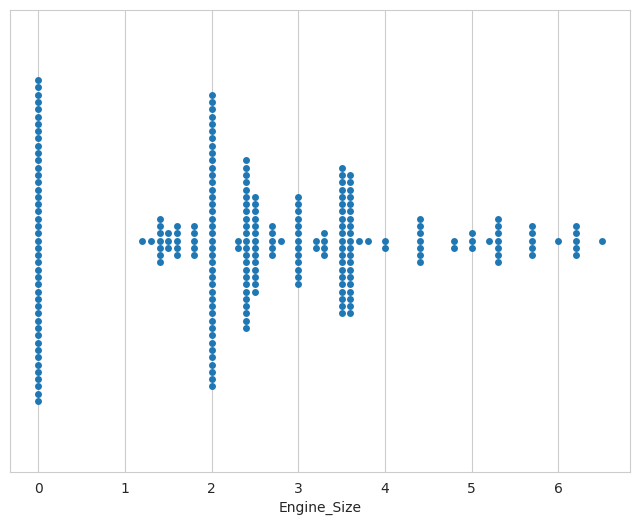

In [115]:
sns.set_style(style="whitegrid")
ax = sns.swarmplot(x=df["Engine_Size"][0:250])

In [116]:
fig = px.scatter(df, x="Engine_Size", y="Cylinders")
fig.update_layout(title_text='Cylinders vs Engine Size ',xaxis_title=" Engine Size (L)",yaxis_title="Cylinders",title_x=0.5)
fig.show(renderer="iframe")

## **Cylinders**

In [117]:
fig = px.histogram(df, x="Cylinders")
fig.update_layout(title_text='Distribution Of Cylinders  ',xaxis_title=" Cylinders ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show(renderer="iframe")

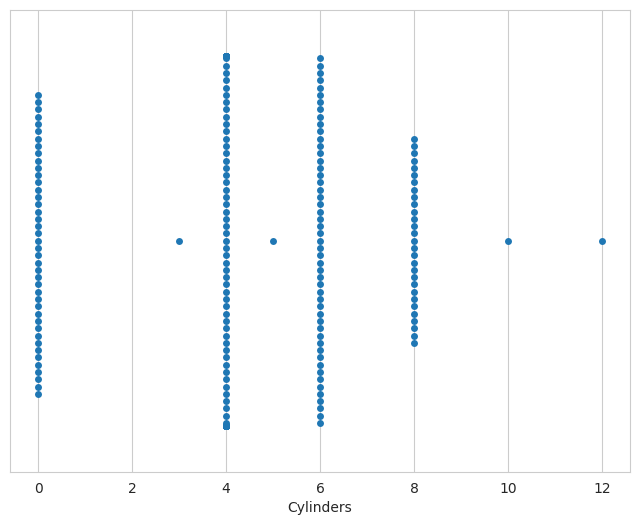

In [118]:
sns.set_style(style="whitegrid")
ax = sns.swarmplot(x=df["Cylinders"][0:250])

In [119]:
fig = go.Figure(data=[go.Histogram(x=df["Cylinders"], histnorm='probability')])
fig.update_layout(title_text='Normalized Distribution Of Cylinders  ',xaxis_title=" Cylinders ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show()

In [120]:
df["Gears"]= df['Transmission'].str[-1]

df['Transmission']=df['Transmission'].str[0:-1]
df.head()

,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City_(L/100km),Fuel_Consumption_Hwy_(L/100km),Fuel_Consumption_Comb,CO2_Emissions(g/km),Gears
0,FOLD,PICKUP TRUCK - STANDARD,3.5,6.0,A,X,8.640000,6.14,7.514808,306.0,6
1,CHEVO,PICKUP TRUCK - STANDARD,5.3,0.0,A,E,27.270000,30.76,28.840000,283.0,6
2,BMV,SUBCOMPACT,4.4,0.0,M,Z,1.700000,2.03,0.000000,329.0,6
3,KIO,SUV - SMALL,0.0,4.0,AS,X,15.337423,15.90,0.000000,270.0,6
4,BARUSU,MINICOMPACT,3.0,6.0,NaN,Z,20.150000,6.00,13.800000,193.0,NaN


In [121]:
df_Transmission=df['Transmission'].value_counts().reset_index().rename(columns={'index':'Transmission','Transmission':'Count'})

In [122]:
df_Transmission

,Count,count
0,AS,52036
1,A,33567
2,M,22983
3,AV,6676
4,AM,6393
5,AS1,4363
6,A1,388
7,AV1,295


In [123]:
df_Transmission.rename(columns={'count': 'Count', 'Count': 'Transmission'}, inplace=True)

In [124]:
fig = px.pie(df_Transmission, values='Count', names='Transmission')

fig.update_traces(hoverinfo='label+percent', textinfo='value+percent', textfont_size=12,insidetextorientation='radial')
fig.update_layout(title="Transmission Distribution",title_x=0.5)
fig.show()

## **Fuel Type**

In [125]:
df_Fuel_Type=df['Fuel_Type'].value_counts().reset_index().rename(columns={'index':'Fuel_Type','Fuel Type':'Count'})

In [126]:
df_Fuel_Type.rename(columns={'count': 'Count', 'Count': 'Fuel_Type'}, inplace=True)

In [127]:
fig = go.Figure(go.Bar(
    x=df_Fuel_Type['Fuel_Type'],y=df_Fuel_Type['Count'],
    marker={'color': df_Fuel_Type['Count'], 
    'colorscale': 'Viridis'},  
    text=df_Fuel_Type['Count'],
    textposition = "outside",
))
fig.update_layout(title_text='Fuel Type Distribution ',xaxis_title="Fuel Type  ",yaxis_title="Number Of Vehicles ",title_x=0.5)
fig.show()

## **Fuel Consumption**

In [128]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_City_(L/100km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption City  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show()

In [129]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_City_(L/100km)"],
    name='Fuel Consumption City',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='Fuel Consumption City',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show()

In [130]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_City_(L/100km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Consumption City'))

fig.update_layout(yaxis_zeroline=False)
fig.show()

In [131]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_Hwy_(L/100km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Highways  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show()

In [132]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_Hwy_(L/100km)"],
    name='Fuel Consumption Hwy',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='Fuel Consumption Highways ',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show()

In [133]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_Hwy_(L/100km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Consumption City'))

fig.update_layout(yaxis_zeroline=False)
fig.show()

In [134]:
fig = go.Figure(data=[go.Histogram(x=df["Fuel_Consumption_Comb"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Combined  ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show()

In [135]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["Fuel_Consumption_Comb"],
    name='Fuel Consumption Comb ',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='The Combined Fuel Consumption',yaxis_title=" L / 100 km ",title_x=0.5)
fig.show()

In [136]:
fig = go.Figure(data=go.Violin(y=df["Fuel_Consumption_Comb"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='Fuel Combined Fuel Consumption'))

fig.update_layout(yaxis_zeroline=False)
fig.show()

In [137]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 11 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Make                             137141 non-null  object 
 1   Vehicle_Class                    137141 non-null  object 
 2   Engine_Size                      137141 non-null  float64
 3   Cylinders                        137141 non-null  float64
 4   Transmission                     126701 non-null  object 
 5   Fuel_Type                        137141 non-null  object 
 6   Fuel_Consumption_City_(L/100km)  137141 non-null  float64
 7   Fuel_Consumption_Hwy_(L/100km)   137141 non-null  float64
 8   Fuel_Consumption_Comb            137141 non-null  float64
 9   CO2_Emissions(g/km)              137141 non-null  float64
 10  Gears                            126701 non-null  object 
dtypes: float64(6), object(5)
memory usage: 11.5+ MB


## **Co2 Emission**

In [138]:
fig = go.Figure(data=[go.Histogram(x=df["CO2_Emissions(g/km)"], histnorm='probability')])
fig.update_layout(title_text='Normalized Fuel Consumption Combined  Mile Per Gallon ',xaxis_title="Fuel Consumption",yaxis_title="Ratio",title_x=0.5)
fig.show()

In [139]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=df["CO2_Emissions(g/km)"],
    name='CO2 Emissions ',
    marker_color='royalblue',
    boxmean='sd' # represent mean and standard deviation
))
fig.update_layout(title_text='CO2 Emissions',yaxis_title="Quantity",title_x=0.5)
fig.show()


In [140]:

fig = go.Figure(data=go.Violin(y=df["CO2_Emissions(g/km)"],
                               box_visible=True,
                               line_color='black',
                               meanline_visible=True,
                               fillcolor='lightseagreen', opacity=0.6,
                               x0='CO2 Emissions'))

fig.update_layout(yaxis_zeroline=False,yaxis_title="Quantity",title_x=0.5)
fig.show()

In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 11 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Make                             137141 non-null  object 
 1   Vehicle_Class                    137141 non-null  object 
 2   Engine_Size                      137141 non-null  float64
 3   Cylinders                        137141 non-null  float64
 4   Transmission                     126701 non-null  object 
 5   Fuel_Type                        137141 non-null  object 
 6   Fuel_Consumption_City_(L/100km)  137141 non-null  float64
 7   Fuel_Consumption_Hwy_(L/100km)   137141 non-null  float64
 8   Fuel_Consumption_Comb            137141 non-null  float64
 9   CO2_Emissions(g/km)              137141 non-null  float64
 10  Gears                            126701 non-null  object 
dtypes: float64(6), object(5)
memory usage: 11.5+ MB


Correlation Matrix


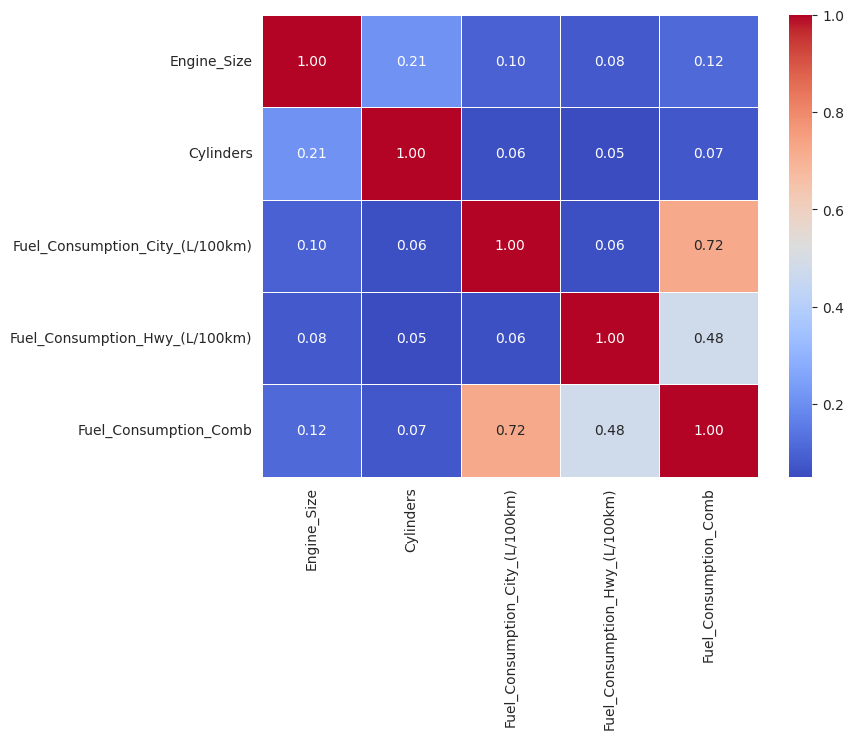

In [142]:
df_numeric=df[['Engine_Size', 'Cylinders', 'Fuel_Consumption_City_(L/100km)', 'Fuel_Consumption_Hwy_(L/100km)', 'Fuel_Consumption_Comb']]
print("Correlation Matrix")
plt.rcParams['figure.figsize']=(8,6)
sns.heatmap(df_numeric.corr(),cmap='coolwarm',linewidths=.5,fmt=".2f",annot = True);

In [143]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137141 entries, 0 to 137140
Data columns (total 11 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Make                             137141 non-null  object 
 1   Vehicle_Class                    137141 non-null  object 
 2   Engine_Size                      137141 non-null  float64
 3   Cylinders                        137141 non-null  float64
 4   Transmission                     126701 non-null  object 
 5   Fuel_Type                        137141 non-null  object 
 6   Fuel_Consumption_City_(L/100km)  137141 non-null  float64
 7   Fuel_Consumption_Hwy_(L/100km)   137141 non-null  float64
 8   Fuel_Consumption_Comb            137141 non-null  float64
 9   CO2_Emissions(g/km)              137141 non-null  float64
 10  Gears                            126701 non-null  object 
dtypes: float64(6), object(5)
memory usage: 11.5+ MB


# **Machine Learning**

In [38]:
#df.drop(['Make','Vehicle_Class','Fuel_Consumption_City_(L/100km)','Fuel_Consumption_Hwy_(L/100km)','Transmission', 'Gears'],inplace=True,axis=1)
df.drop(['Make','Vehicle_Class','Fuel_Consumption_City_(L/100km)','Fuel_Consumption_Hwy_(L/100km)','Transmission'],inplace=True,axis=1)

In [39]:
df.head()

,Engine_Size,Cylinders,Fuel_Type,Fuel_Consumption_Comb,CO2_Emissions(g/km)
0,3.5,6.0,X,7.514808,306.0
1,5.3,0.0,E,28.840000,283.0
2,4.4,0.0,Z,0.000000,329.0
3,0.0,4.0,X,0.000000,270.0
4,3.0,6.0,Z,13.800000,193.0


In [40]:
df_N=df[df["Fuel_Type"]=="N"]
indexs=df_N.index
df_N

,Engine_Size,Cylinders,Fuel_Type,Fuel_Consumption_Comb,CO2_Emissions(g/km)
4136,3.6,6.0,N,11.090000,215.0
19090,0.0,6.0,N,9.046733,210.0
23750,2.5,4.0,N,2.699587,203.0
26358,0.0,0.0,N,9.102750,210.0
28952,1.6,4.0,N,6.596306,211.0
30770,3.6,6.0,N,3.688491,211.0
37332,3.0,6.0,N,15.444193,203.0
44814,3.6,0.0,N,10.799136,209.0
45307,2.4,4.0,N,20.500000,215.0
50264,3.6,6.0,N,6.753232,214.0


In [41]:
# Kick Fuel Type N
for i in indexs:
    df.drop(i, axis = 0,inplace = True)

In [42]:
df[df["Fuel_Type"]=="N"]

,Engine_Size,Cylinders,Fuel_Type,Fuel_Consumption_Comb,CO2_Emissions(g/km)


In [44]:
dums = pd.get_dummies(df['Fuel_Type'], prefix="Fuel_Type", drop_first=True)
dums = dums.astype(int)
print(dums.head(15))


    Fuel_Type_D  Fuel_Type_E  Fuel_Type_X  Fuel_Type_Z
0             0            0            1            0
1             0            1            0            0
2             0            0            0            1
3             0            0            1            0
4             0            0            0            1
5             0            0            0            1
6             0            0            1            0
7             0            0            0            1
8             0            0            1            0
9             0            0            1            0
10            0            0            1            0
11            0            0            0            1
12            0            0            1            0
13            0            0            1            0
14            0            0            0            0


In [45]:
frames = [df, dums]
result = pd.concat(frames,axis=1)
result

,Engine_Size,Cylinders,Fuel_Type,Fuel_Consumption_Comb,CO2_Emissions(g/km),Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
0,3.5,6.0,X,7.514808,306.0,0,0,1,0
1,5.3,0.0,E,28.840000,283.0,0,1,0,0
2,4.4,0.0,Z,0.000000,329.0,0,0,0,1
3,0.0,4.0,X,0.000000,270.0,0,0,1,0
4,3.0,6.0,Z,13.800000,193.0,0,0,0,1
...,...,...,...,...,...,...,...,...,...
137136,0.0,8.0,Z,22.026432,275.0,0,0,0,1
137137,1.5,4.0,X,3.961183,166.0,0,0,1,0
137138,1.8,4.0,X,5.412563,181.0,0,0,1,0
137139,1.8,4.0,X,6.400000,123.0,0,0,1,0


In [46]:
result.drop(['Fuel_Type'],inplace=True,axis=1)
result.head()

,Engine_Size,Cylinders,Fuel_Consumption_Comb,CO2_Emissions(g/km),Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
0,3.5,6.0,7.514808,306.0,0,0,1,0
1,5.3,0.0,28.840000,283.0,0,1,0,0
2,4.4,0.0,0.000000,329.0,0,0,0,1
3,0.0,4.0,0.000000,270.0,0,0,1,0
4,3.0,6.0,13.800000,193.0,0,0,0,1


In [47]:
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor(n_neighbors = 20, contamination = 0.1)

In [48]:
df_out=result.copy()
clf.fit_predict(df_out)
df_scores = clf.negative_outlier_factor_

In [49]:
np.sort(df_scores)[0:25]

array([-3.30003992, -3.25176057, -3.04732631, -2.84659815, -2.84513466,
       -2.74770932, -2.73717148, -2.72941034, -2.72305663, -2.72199043,
       -2.70968374, -2.61792959, -2.60854361, -2.60513871, -2.60468736,
       -2.60413126, -2.58584425, -2.58249367, -2.57705017, -2.57093483,
       -2.54420049, -2.53488547, -2.52840414, -2.52295471, -2.52116746])

In [50]:
threshold_value = np.sort(df_scores)[24]
threshold_value

-2.521167455692078

In [51]:
Outlier_df= df_out[df_scores < threshold_value]
indexs=Outlier_df.index
Outlier_df

,Engine_Size,Cylinders,Fuel_Consumption_Comb,CO2_Emissions(g/km),Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
3935,1.4,4.0,11.210000,96.0,0,0,0,1
5761,6.0,12.0,14.184397,316.0,0,0,1,0
6349,3.0,6.0,0.000000,96.0,0,0,1,0
7801,0.0,8.0,9.720000,96.0,0,0,1,0
11139,0.0,6.0,7.369197,96.0,0,0,1,0
23912,3.3,6.0,0.000000,96.0,0,0,0,0
24263,6.4,8.0,0.000000,273.0,0,0,1,0
25740,2.0,4.0,6.706908,96.0,0,1,0,0
36153,1.8,4.0,48.298780,96.0,0,0,1,0
38998,0.0,8.0,6.435432,96.0,0,0,1,0


In [52]:
# Kick Outliers
for i in indexs:
    result.drop(i, axis = 0,inplace = True)

In [53]:
result.info()


<class 'pandas.core.frame.DataFrame'>
Index: 137093 entries, 0 to 137140
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Engine_Size            137093 non-null  float64
 1   Cylinders              137093 non-null  float64
 2   Fuel_Consumption_Comb  137093 non-null  float64
 3   CO2_Emissions(g/km)    137093 non-null  float64
 4   Fuel_Type_D            137093 non-null  int64  
 5   Fuel_Type_E            137093 non-null  int64  
 6   Fuel_Type_X            137093 non-null  int64  
 7   Fuel_Type_Z            137093 non-null  int64  
dtypes: float64(4), int64(4)
memory usage: 9.4 MB


In [159]:
sample_df=result.sample(n=200,random_state=35)
sample_df

,Engine_Size,Cylinders,Fuel_Consumption_Comb,CO2_Emissions(g/km),Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
104556,3.7,0.0,22.295315,421.0,0,0,1,0
28809,3.5,6.0,47.500000,256.0,0,0,1,0
113341,0.0,0.0,9.606148,192.0,0,0,0,0
4020,3.0,0.0,5.238345,296.0,0,0,0,1
67251,0.0,6.0,9.600000,284.0,0,0,0,1
...,...,...,...,...,...,...,...,...
39613,4.4,8.0,5.157298,270.0,0,0,0,1
14779,0.0,4.0,17.006803,209.0,0,0,1,0
102216,3.2,6.0,7.720000,282.0,0,0,1,0
21191,5.7,8.0,5.882583,352.0,0,0,1,0


In [160]:
indexs=sample_df.index
indexs

Index([104556,  28809, 113341,   4020,  67251,  91226, 112720, 112769,  20051,
       106322,
       ...
        41822,  47814,  71835, 129991,  51973,  39613,  14779, 102216,  21191,
       116893],
      dtype='int64', length=200)

In [161]:
# Kick Sample DataFrame
for i in indexs:
    result.drop(i, axis = 0,inplace = True)

In [162]:
sample_df_Xtest=sample_df.drop(['CO2_Emissions(g/km)'],axis=1)
sample_df_ytest=sample_df["CO2_Emissions(g/km)"]

In [163]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137117 entries, 0 to 137140
Data columns (total 5 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Engine_Size            137117 non-null  float64
 1   Cylinders              137117 non-null  float64
 2   Fuel_Type              137117 non-null  object 
 3   Fuel_Consumption_Comb  137117 non-null  float64
 4   CO2_Emissions(g/km)    137117 non-null  float64
dtypes: float64(4), object(1)
memory usage: 10.3+ MB


In [164]:
normalized_df = (sample_df_Xtest - sample_df_Xtest.min()) / (sample_df_Xtest.max() - sample_df_Xtest.min())
sample_df_Xtest["Engine_Size"]=sample_df_Xtest["Engine_Size"].map(lambda x:round(x,2))
sample_df_Xtest["Cylinders"]=sample_df_Xtest["Cylinders"].map(lambda x:round(x,2))
sample_df_Xtest["Fuel_Consumption_Comb"]=sample_df_Xtest["Fuel_Consumption_Comb"].map(lambda x:round(x,2))
sample_df_Xtest

,Engine_Size,Cylinders,Fuel_Consumption_Comb,Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
104556,3.7,0.0,22.30,0,0,1,0
28809,3.5,6.0,47.50,0,0,1,0
113341,0.0,0.0,9.61,0,0,0,0
4020,3.0,0.0,5.24,0,0,0,1
67251,0.0,6.0,9.60,0,0,0,1
...,...,...,...,...,...,...,...
39613,4.4,8.0,5.16,0,0,0,1
14779,0.0,4.0,17.01,0,0,1,0
102216,3.2,6.0,7.72,0,0,1,0
21191,5.7,8.0,5.88,0,0,1,0


In [165]:
X = result.drop(['CO2_Emissions(g/km)'], axis= 1)
y = result["CO2_Emissions(g/km)"]

In [166]:
X = (X - np.min(X)) / (np.max(X) - np.min(X))

In [167]:
X

,Engine_Size,Cylinders,Fuel_Consumption_Comb,Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
0,0.05775,0.099,0.123994,0.0,0.0000,0.0165,0.0000
1,0.08745,0.000,0.475860,0.0,0.0165,0.0000,0.0000
2,0.07260,0.000,0.000000,0.0,0.0000,0.0000,0.0165
3,0.00000,0.066,0.000000,0.0,0.0000,0.0165,0.0000
4,0.04950,0.099,0.227700,0.0,0.0000,0.0000,0.0165
...,...,...,...,...,...,...,...
137136,0.00000,0.132,0.363436,0.0,0.0000,0.0000,0.0165
137137,0.02475,0.066,0.065360,0.0,0.0000,0.0165,0.0000
137138,0.02970,0.066,0.089307,0.0,0.0000,0.0165,0.0000
137139,0.02970,0.066,0.105600,0.0,0.0000,0.0165,0.0000


In [168]:
X["Engine_Size"]=X["Engine_Size"].map(lambda x:round(x,2))
X["Cylinders"]=X["Cylinders"].map(lambda x:round(x,2))
X["Fuel_Consumption_Comb"]=X["Fuel_Consumption_Comb"].map(lambda x:round(x,2))
X

,Engine_Size,Cylinders,Fuel_Consumption_Comb,Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
0,0.06,0.10,0.12,0.0,0.0000,0.0165,0.0000
1,0.09,0.00,0.48,0.0,0.0165,0.0000,0.0000
2,0.07,0.00,0.00,0.0,0.0000,0.0000,0.0165
3,0.00,0.07,0.00,0.0,0.0000,0.0165,0.0000
4,0.05,0.10,0.23,0.0,0.0000,0.0000,0.0165
...,...,...,...,...,...,...,...
137136,0.00,0.13,0.36,0.0,0.0000,0.0000,0.0165
137137,0.02,0.07,0.07,0.0,0.0000,0.0165,0.0000
137138,0.03,0.07,0.09,0.0,0.0000,0.0165,0.0000
137139,0.03,0.07,0.11,0.0,0.0000,0.0165,0.0000


In [169]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y, 
                                                    test_size=0.25, 
                                                    random_state=42)

print("X_train", X_train.shape)

print("y_train",y_train.shape)

print("X_test",X_test.shape)

print("y_test",y_test.shape)

X_train (102669, 7)
y_train (102669,)
X_test (34224, 7)
y_test (34224,)


## **Linear Regression**

In [170]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
model = lm.fit(X_train, y_train)

In [171]:
model.intercept_

177.0301036806193

In [172]:
model.coef_

array([ 840.12869929,  208.6585101 ,  122.34710014, -612.10856406,
       1400.94535336, -622.84420165, 1241.61655754])

In [173]:
from sklearn.metrics import mean_squared_error, r2_score
np.sqrt(mean_squared_error(y_train, model.predict(X_train)))

68.40328349064539

In [174]:
np.sqrt(mean_squared_error(y_test, model.predict(X_test)))

68.03826533914592

In [175]:
model.score(X_train, y_train)

0.2129606602258849

In [176]:
cross_val_score(model, X_train, y_train, cv = 10, scoring = "r2").mean()

0.21277734328913095

In [177]:
pred=model.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Lin=result_pred.rename(columns={0:'Pred_Linear',1:'Real_Value'})
result_pred_Lin["Pred_Linear"]=result_pred_Lin["Pred_Linear"].map(lambda x:round(x,2))
result_pred_Lin["Diff"]=result_pred_Lin["Pred_Linear"]-result_pred_Lin["Real_Value"]
result_pred_Lin["Diff"]=result_pred_Lin["Diff"]
print("Mean Diff: ",abs(result_pred_Lin["Diff"]).mean())
result_pred_Lin.head(20)

Mean Diff:  4260.400033469248


,Pred_Linear,Real_Value,Diff
0,5391.00,421.0,4970.00
1,9558.07,256.0,9302.07
2,1352.79,192.0,1160.79
3,4580.13,296.0,4284.13
4,3845.13,284.0,3561.13
5,2724.44,187.0,2537.44
6,4214.84,194.0,4020.84
7,6298.37,232.0,6066.37
8,2350.47,180.0,2170.47
9,3819.46,239.0,3580.46


In [178]:
model.score(sample_df_Xtest, sample_df_ytest)

-4894.374550950025

## **Ridge Regression**

In [179]:
from sklearn.linear_model import Ridge

In [180]:
ridge_model = Ridge(alpha = 0.1).fit(X_train, y_train)

In [181]:
ridge_model.coef_

array([ 840.61311732,  209.17153057,  122.50603026, -577.18778988,
       1235.52303718, -692.05555142, 1152.57430266])

In [182]:
y_pred = ridge_model.predict(X_test)

In [183]:
np.sqrt(mean_squared_error(y_test, y_pred))

68.03583906023994

### Tuning

In [184]:
lambdalar = 10**np.linspace(10,-2,100)*0.5 

In [185]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import RidgeCV

# Misalkan X_train adalah data latihan yang ingin dinormalisasi
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)

# Menginisialisasi model RidgeCV
ridge_cv = RidgeCV(alphas=lambdalar, scoring="neg_mean_squared_error")
# Melatih model pada data yang telah dinormalisasi
ridge_cv.fit(X_train_normalized, y_train)


RidgeCV(alphas=array([5.00000000e+09, 3.78231664e+09, 2.86118383e+09, 2.16438064e+09,
       1.63727458e+09, 1.23853818e+09, 9.36908711e+08, 7.08737081e+08,
       5.36133611e+08, 4.05565415e+08, 3.06795364e+08, 2.32079442e+08,
       1.75559587e+08, 1.32804389e+08, 1.00461650e+08, 7.59955541e+07,
       5.74878498e+07, 4.34874501e+07, 3.28966612e+07, 2.48851178e+07,
       1.88246790e+07, 1.42401793e+0...
       3.06795364e+00, 2.32079442e+00, 1.75559587e+00, 1.32804389e+00,
       1.00461650e+00, 7.59955541e-01, 5.74878498e-01, 4.34874501e-01,
       3.28966612e-01, 2.48851178e-01, 1.88246790e-01, 1.42401793e-01,
       1.07721735e-01, 8.14875417e-02, 6.16423370e-02, 4.66301673e-02,
       3.52740116e-02, 2.66834962e-02, 2.01850863e-02, 1.52692775e-02,
       1.15506485e-02, 8.73764200e-03, 6.60970574e-03, 5.00000000e-03]),
        scoring='neg_mean_squared_error')

In [186]:
ridge_cv.alpha_

1.328043891473342

In [187]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge

# Misalkan X_train adalah data latihan yang ingin digunakan dalam model
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)

# Inisialisasi dan pelatihan model Ridge dengan alpha dari RidgeCV dan data yang telah dinormalisasi
ridge_tuned = Ridge(alpha=ridge_cv.alpha_)
ridge_tuned.fit(X_train_normalized, y_train)


Ridge(alpha=1.328043891473342)

In [188]:
np.sqrt(mean_squared_error(y_test, ridge_tuned.predict(X_test)))

85.74782316419665

In [189]:
ridge_tuned.score(sample_df_Xtest, sample_df_ytest)

-754.6874659039927

In [190]:
pred=ridge_tuned.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Rid=result_pred.rename(columns={0:'Pred_Ridge',1:'Real'})
result_pred_Rid["Pred_Ridge"]=result_pred_Rid["Pred_Ridge"].map(lambda x:round(x,2))
result_pred_Rid["Diff"]=result_pred_Rid["Pred_Ridge"]-result_pred_Rid["Real"]
result_pred_Rid["Diff"]=result_pred_Rid["Diff"]
print("Mean Diff: ",abs(result_pred_Rid["Diff"]).mean())
result_pred_Rid.head(20)

Mean Diff:  1663.4979334692482


,Pred_Ridge,Real,Diff
0,3055.54,421.0,2634.54
1,6055.18,256.0,5799.18
2,1234.47,192.0,1042.47
3,1126.86,296.0,830.86
4,1504.21,284.0,1220.21
5,1477.24,187.0,1290.24
6,2125.37,194.0,1931.37
7,2713.34,232.0,2481.34
8,1204.71,180.0,1024.71
9,1887.85,239.0,1648.85


## **Lasso Regression**

In [191]:
from sklearn.linear_model import Lasso
lasso_model = Lasso(alpha = 0.1).fit(X_train, y_train)

In [192]:
lasso_model.coef_

array([ 773.23796991,  182.89779111,  125.83663625,   -0.        ,
          0.        , -119.21215534,    0.        ])

In [193]:
y_pred = lasso_model.predict(X_test)

In [194]:
np.sqrt(mean_squared_error(y_test, y_pred))

69.38609766511642

In [195]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LassoCV

# Misalkan X_train adalah data latihan yang ingin digunakan dalam model
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)

# Inisialisasi dan pelatihan model LassoCV dengan alpha yang dihitung secara otomatis
lasso_cv_model = LassoCV(alphas=None, cv=10, max_iter=10000)
lasso_cv_model.fit(X_train_normalized, y_train)


LassoCV(cv=10, max_iter=10000)

In [196]:
lasso_cv_model.fit(X_train,y_train)

LassoCV(cv=10, max_iter=10000)

In [197]:
lasso_tuned = Lasso(alpha = lasso_cv_model.alpha_)

In [198]:
lasso_tuned.fit(X_train, y_train)

Lasso(alpha=0.002106659890473064)

In [199]:
y_pred = lasso_tuned.predict(X_test)

In [200]:
np.sqrt(mean_squared_error(y_test, y_pred))

68.04324843307455

In [201]:
lasso_tuned.score(sample_df_Xtest, sample_df_ytest)

-4882.309446025066

In [202]:
pred=lasso_tuned.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Las=result_pred.rename(columns={0:'Pred_Lasso',1:'Real'})
result_pred_Las["Pred_Lasso"]=result_pred_Las["Pred_Lasso"].map(lambda x:round(x,2))
result_pred_Las["Diff"]=result_pred_Las["Pred_Lasso"]-result_pred_Las["Real"]
result_pred_Las["Diff"]=result_pred_Las["Diff"]
print("Mean Diff: ",abs(result_pred_Las["Diff"]).mean())
result_pred_Las.head(20)

Mean Diff:  4260.390883469248


,Pred_Lasso,Real,Diff
0,5411.71,421.0,4990.71
1,9585.05,256.0,9329.05
2,1355.15,192.0,1163.15
3,4554.34,296.0,4258.34
4,3818.41,284.0,3534.41
5,2740.23,187.0,2553.23
6,4233.32,194.0,4039.32
7,6143.64,232.0,5911.64
8,2365.59,180.0,2185.59
9,3836.56,239.0,3597.56


## **KNN**

In [203]:
from sklearn.neighbors import KNeighborsRegressor

In [204]:
knn_model = KNeighborsRegressor().fit(X_train, y_train)

In [205]:
y_pred = knn_model.predict(X_test)

In [206]:
np.sqrt(mean_squared_error(y_test, y_pred))


66.07178981421234

In [207]:
knn_model.score(X_train, y_train)


0.3048218267650783

In [208]:
knn_model.score(sample_df_Xtest, sample_df_ytest)

-0.7784885459629876

In [209]:
from sklearn.model_selection import GridSearchCV
knn_params = {'n_neighbors': np.arange(1,30,1)}
knn = KNeighborsRegressor()
knn_cv_model = GridSearchCV(knn, knn_params, cv = 10)

In [210]:
knn_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])})

In [211]:
knn_cv_model.best_params_["n_neighbors"]

29

In [212]:
knn_tuned = KNeighborsRegressor(n_neighbors = knn_cv_model.best_params_["n_neighbors"])

In [213]:
knn_tuned.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=29)

In [214]:
np.sqrt(mean_squared_error(y_test, knn_tuned.predict(X_test)))

62.198006757696646

In [215]:
knn_tuned.score(sample_df_Xtest, sample_df_ytest)

-1.8222581194158671

In [216]:
pred=knn_tuned.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Knn=result_pred.rename(columns={0:'Pred_KNN',1:'Real'})
result_pred_Knn["Pred_KNN"]=result_pred_Knn["Pred_KNN"].map(lambda x:round(x,2))
result_pred_Knn["Diff"]=result_pred_Knn["Pred_KNN"]-result_pred_Knn["Real"]
result_pred_Knn["Diff"]=result_pred_Knn["Diff"]
print("Mean Diff: ",abs(result_pred_Knn["Diff"]).mean())
result_pred_Knn.head(20)

Mean Diff:  98.79909794343925


,Pred_KNN,Real,Diff
0,311.98,421.0,-109.02
1,312.60,256.0,56.60
2,312.77,192.0,120.77
3,324.70,296.0,28.70
4,321.53,284.0,37.53
5,325.80,187.0,138.80
6,314.67,194.0,120.67
7,311.77,232.0,79.77
8,334.08,180.0,154.08
9,322.18,239.0,83.18


In [ ]:
pred_test=knn_tuned.predict(df_test)

## SVR

In [217]:
from sklearn.svm import SVR

In [218]:
svr_model = SVR(kernel="rbf").fit(X_train, y_train)

In [219]:
y_pred = svr_model.predict(X_test)

In [220]:
np.sqrt(mean_squared_error(y_test, y_pred))

64.02856898486465

In [221]:
svr_params = {"C": [0.01, 0.1,0.4,5,10,20,30,40,50]}
svr_cv_model = GridSearchCV(svr_model,svr_params, cv = 10)
svr_cv_model.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
pd.Series(svr_cv_model.best_params_)[0]

In [ ]:
svr_tuned = SVR("rbf", C = pd.Series(svr_cv_model.best_params_)[0]).fit(X_train, y_train)

In [ ]:
y_pred = svr_tuned.predict(X_test)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
svr_tuned.score(sample_df_Xtest, sample_df_ytest)

In [ ]:
pred=svr_tuned.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Svr=result_pred.rename(columns={0:'Pred_SVR',1:'Real'})
result_pred_Svr["Pred_SVR"]=result_pred_Svr["Pred_SVR"].map(lambda x:round(x,2))
result_pred_Svr["Diff"]=result_pred_Svr["Pred_SVR"]-result_pred_Svr["Real"]
result_pred_Svr["Diff"]=result_pred_Svr["Diff"]
print("Mean Diff: ",abs(result_pred_Svr["Diff"]).mean())
result_pred_Svr.head(20)

## **Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_model = RandomForestRegressor(random_state = 42)

In [ ]:
rf_model.fit(X_train, y_train)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
rf_params = {'max_depth': list(range(1,10)),
            'max_features': [3,5,10,15],
            'n_estimators' : [100, 200, 500, 750]}

In [ ]:
rf_model = RandomForestRegressor(random_state = 42)

In [ ]:
rf_cv_model = GridSearchCV(rf_model, 
                           rf_params, 
                           cv = 10, 
                            n_jobs = -1,
                          verbose = 2)

In [ ]:
rf_cv_model.fit(X_train, y_train)

In [ ]:
rf_cv_model.best_params_

In [ ]:
rf_tuned = RandomForestRegressor(max_depth  = 9, 
                                 max_features = 5, 
                                 n_estimators =750)

In [ ]:
rf_tuned.fit(X_train, y_train)

In [ ]:
y_pred = rf_tuned.predict(X_test)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
Importance = pd.DataFrame({"Importance": rf_tuned.feature_importances_*100},
                         index = X_train.columns)

In [ ]:
Importance.sort_values(by = "Importance", 
                       axis = 0, 
                       ascending = True).plot(kind ="barh", color = "r")

plt.xlabel("Variable Significance Levels")

In [ ]:
rf_tuned.score(sample_df_Xtest, sample_df_ytest)

In [ ]:
pred=rf_tuned.predict(sample_df_Xtest)
frames = [pred, sample_df_ytest.values]
result_pred = pd.DataFrame(data=frames)
result_pred=result_pred.T

result_pred_Rf=result_pred.rename(columns={0:'Pred_RF',1:'Real'})
result_pred_Rf["Pred_RF"]=result_pred_Rf["Pred_RF"].map(lambda x:round(x,2))
result_pred_Rf["Diff"]=result_pred_Rf["Pred_RF"]-result_pred_Rf["Real"]
result_pred_Rf["Diff"]=result_pred_Rf["Diff"]
print("Mean Diff: ",abs(result_pred_Rf["Diff"]).mean())
result_pred_Rf.head(20)

In [ ]:
result = pd.concat([result_pred_Lin,result_pred_Rid, result_pred_Las,
                    result_pred_Knn, result_pred_Svr, result_pred_Rf,
                    ],
                   axis=1,
                   sort=False)
final_result=result["Real_Value"]
final_result=pd.DataFrame(final_result)
result.drop(['Diff',"Real"],inplace=True,axis=1)
final_result=pd.concat([final_result,result],axis=1)

In [ ]:
colors=['lightblue','lightpink','lightgreen','yellow',
        'DarkSalmon','Khaki','LightCoral']
        
fig = go.Figure(data=[go.Table(header=dict(values=['Real Value', 'Pred Linear','Pred Ridge',
'Pred Lasso','Pred KNN','Pred SVR','Pred RF'],

line_color='white', fill_color='LightSlateGray',
align='center',font=dict(color='white', size=12)
                           ),
                               
 cells=dict( values=[final_result['Real_Value'],
     final_result['Pred_Linear'],
      final_result['Pred_Ridge'],
      final_result['Pred_Lasso'],
    final_result['Pred_KNN'],
       final_result['Pred_SVR'],
      final_result['Pred_RF'],
        ],
      line_color=colors, fill_color=colors,
     align='center', font=dict(color='#660033', size=11))
                  )])
                      
fig.show()

In [55]:
!pip install pycaret[full]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.7/484.7 kB 6.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.6/282.6 kB 7.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 22.7 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 29.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 65.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 59.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 36.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━

In [54]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137093 entries, 0 to 137140
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Engine_Size            137093 non-null  float64
 1   Cylinders              137093 non-null  float64
 2   Fuel_Consumption_Comb  137093 non-null  float64
 3   CO2_Emissions(g/km)    137093 non-null  float64
 4   Fuel_Type_D            137093 non-null  int64  
 5   Fuel_Type_E            137093 non-null  int64  
 6   Fuel_Type_X            137093 non-null  int64  
 7   Fuel_Type_Z            137093 non-null  int64  
dtypes: float64(4), int64(4)
memory usage: 9.4 MB


In [63]:
result

,Engine_Size,Cylinders,Fuel_Consumption_Comb,CO2_Emissions(g/km),Fuel_Type_D,Fuel_Type_E,Fuel_Type_X,Fuel_Type_Z
0,3.5,6.0,7.514808,306.0,0,0,1,0
1,5.3,0.0,28.840000,283.0,0,1,0,0
2,4.4,0.0,0.000000,329.0,0,0,0,1
3,0.0,4.0,0.000000,270.0,0,0,1,0
4,3.0,6.0,13.800000,193.0,0,0,0,1
...,...,...,...,...,...,...,...,...
137136,0.0,8.0,22.026432,275.0,0,0,0,1
137137,1.5,4.0,3.961183,166.0,0,0,1,0
137138,1.8,4.0,5.412563,181.0,0,0,1,0
137139,1.8,4.0,6.400000,123.0,0,0,1,0


In [64]:
from pycaret.regression import *
s = setup(result, target = 'CO2_Emissions(g/km)', session_id = 123)

,Description,Value
0,Session id,123
1,Target,CO2_Emissions(g/km)
2,Target type,Regression
3,Original data shape,"(137093, 8)"
4,Transformed data shape,"(137093, 8)"
5,Transformed train set shape,"(95965, 8)"
6,Transformed test set shape,"(41128, 8)"
7,Numeric features,7
8,Preprocess,True
9,Imputation type,simple


In [67]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,38.6737,3707.7695,60.8883,0.3751,0.2280,0.1629,3.6340
lightgbm,Light Gradient Boosting Machine,38.7257,3710.2012,60.9085,0.3747,0.2282,0.1633,261.8640
xgboost,Extreme Gradient Boosting,38.9989,3755.3364,61.2773,0.3671,0.2292,0.1641,2.0530
gbr,Gradient Boosting Regressor,39.3817,3769.7838,61.3957,0.3646,0.2306,0.1666,0.5250
knn,K Neighbors Regressor,44.7420,4449.4332,66.7012,0.2500,0.2511,0.1875,0.7030
ridge,Ridge Regression,47.9380,4686.1557,68.4527,0.2102,0.2609,0.2041,0.5850
lr,Linear Regression,47.9381,4686.1556,68.4527,0.2102,0.2609,0.2041,0.9910
lar,Least Angle Regression,47.9381,4686.1557,68.4527,0.2102,0.2609,0.2041,0.5760
br,Bayesian Ridge,47.9373,4686.1559,68.4527,0.2102,0.2609,0.2041,0.5110
llar,Lasso Least Angle Regression,47.9933,4711.3458,68.6365,0.2060,0.2621,0.2050,0.4770


In [1]:
predictions = predict_model(best, data=data)

NameError: name 'predict_model' is not defined

In [ ]:
!pip uninstall scikit-learn imbalanced-learn -y
!pip install scikit-learn imbalanced-learn
!pip install scikit-learn==0.24.2 imbalanced-learn==0.8.0
!pip install --upgrade scikit-learn imbalanced-learn
